In [2]:
import numpy as np
import skimage
from scipy.ndimage import gaussian_filter
from scipy.signal import convolve2d
from PIL import Image 
import matplotlib.pyplot as plt

thresholds0_30=[0,10,20,30]
thresholds40_100=[40,60,80,100]



def get_threshold_values(arr,threshold):
    result = np.zeros_like(arr)

# Iterate over each element in the array
    for i in range(arr.shape[0]):  # Loop over rows
        for j in range(arr.shape[1]):  # Loop over columns
            if arr[i, j] > threshold:  # Check if value passes the threshold
                result[i, j] = arr[i,j]

    return result

def plot_binary_image(image,thresholds, filter_name,fig_size):
    plt.figure(figsize=fig_size)
    plt.tight_layout()
    for i, j in enumerate(thresholds):
        #i is the indexj the value of threshold
        plt.subplot(1,len(thresholds),i+1)
        plt.title(f"{filter_name} with Threhsold > {j} ")
        plt.imshow(image>j, cmap='gray')
        plt.axis('off')

##apply a gaussian to an image 
##
shakey= skimage.io.imread('shakey.150.gif')
shakey_rgb=skimage.color.gray2rgb(shakey)[0,:,:,0]


# apply a gaussian filter  
gaussian_filter_3x3 = np.array([
    [0.0113,0.0838,0.0113],
    [0.0838,0.6193,0.0838],
    [0.0113,0.0838,0.0113]
])
gaussian_filter_5x5 = np.array([
 [0.00297025, 0.0133089,  0.0219417,  0.0133089,  0.00297025],
 [0.0133089,  0.05963364, 0.09831492, 0.05963364, 0.0133089 ],
 [0.0219417,  0.09831492, 0.16208676, 0.09831492, 0.0219417 ],
 [0.0133089,  0.05963364, 0.09831492, 0.05963364, 0.0133089 ],
 [0.00297025, 0.0133089,  0.0219417,  0.0133089 , 0.00297025]
])
def gaussian_mask(x,y,sigma):
    #gaussian formula
    gaussian_mask=np.exp(-(x**2 + y**2)/(2*sigma**2))
    return gaussian_mask

def laplacian_mask(x,y,sigma):
    #laplacian mask formula
    laplacian_mask=-1/(np.pi * sigma**4) * (1 - (x**2 + y**2)/(2*sigma**2)) 
    return laplacian_mask
def apply_log_filter(image,sigma,kernel_size):
    #create image_filter 
    center = (kernel_size) // 2
    
    log_mask=np.zeros((kernel_size, kernel_size))
    for i in range(kernel_size):
        for j in range(kernel_size):
            x,y= i-center,j-center#center the coordinates 
            # if kernel size 5, when the i value 0 it would mean result of x would be -2, -2 in python means accesing the 3rd index
            # y also has the value of -2, so it access the middle area of the kernel, it's not exactly in the middle
            # testing has shown that correcting the image to be exactly in the middle results in less edge detection 
            log_mask[x,y]=laplacian_mask(x,y,sigma)*gaussian_mask(x,y,sigma)
    
    laplacian_image=convolve2d(image,log_mask,mode="same")
    return laplacian_image





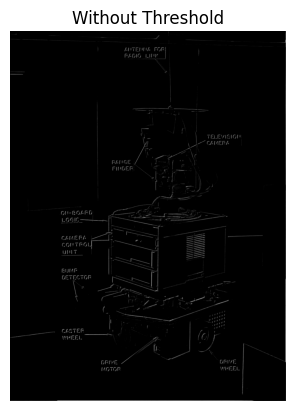

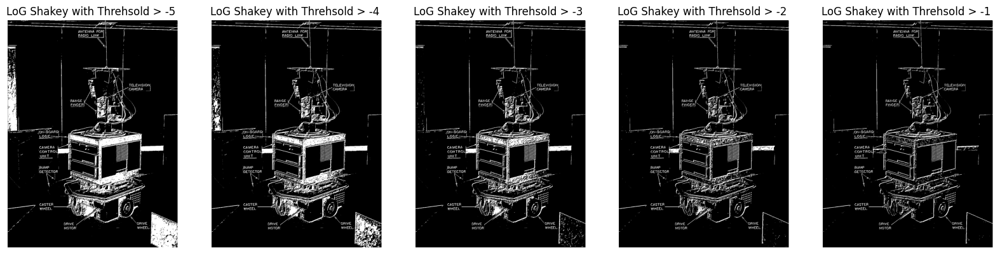

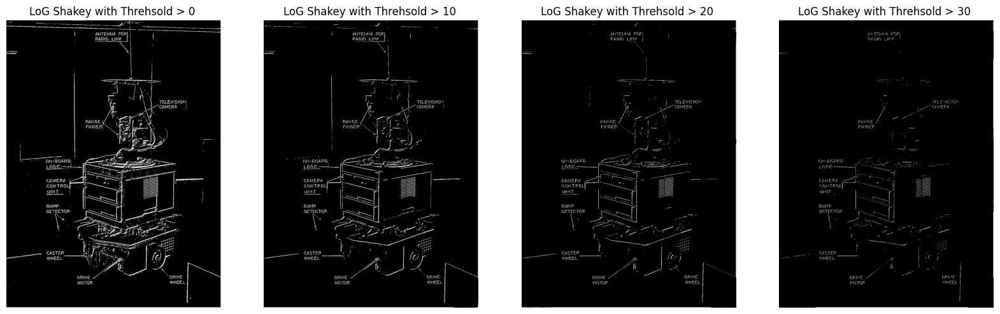

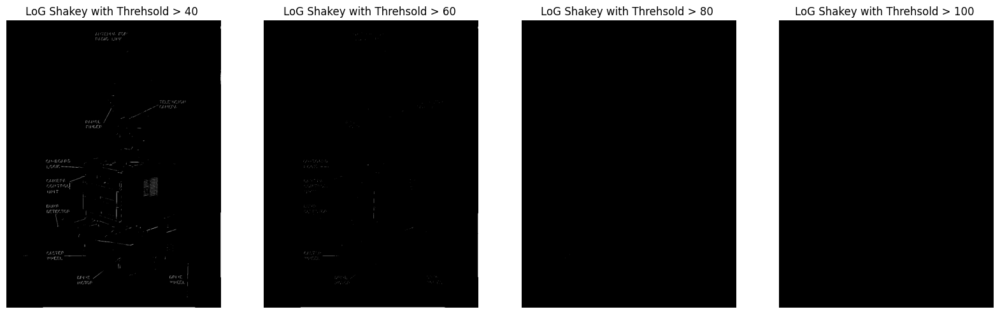

In [3]:

## derivate the image with respect to x axis 
# plt.imshow(get_threshold_values(final_gaussian_image3,80), cmap='gray')
thresholds0_30=[0,10,20,30]
thresholds40_100=[40,60,80,100]
log_image=apply_log_filter(shakey_rgb,1,5)
result_image = Image.fromarray(log_image).convert('L')
#show image without thresholding
plt.imshow(result_image,cmap='gray')
plt.title('Without Threshold')
plt.axis('off')
#observe image with different threshold
plot_binary_image(log_image,[-5,-4,-3,-2,-1],"LoG Shakey",(20,20))
plot_binary_image(log_image,thresholds0_30,"LoG Shakey",(20,20))
plot_binary_image(log_image,thresholds40_100,"LoG Shakey",(20,20))






(-0.5, 1116.5, 1499.5, -0.5)

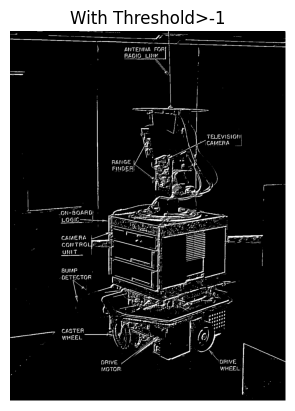

In [4]:

plt.imshow(log_image>-1,cmap='gray')
plt.title('With Threshold>-1')
plt.axis('off')

No 2

In [5]:
import cv2

image1 = cv2.imread('cells/10905 JL.bmp')[:,:,1] #select only the green channel 

image2 = cv2.imread('cells/9343 AM.bmp')[:,:,1] #select only the green channel 

image3 = cv2.imread('cells/43590 AM.bmp')[:,:,1] #select only the green channel 


print(image1.shape)



def absolute(x,y):
    return np.add(abs(x),abs(y))

def apply_sobel_filter(image):
    sobel_x = np.array(
    [[1,0,-1],
     [2,0,-2],
     [1,0,-1]])

    sobel_y = np.array(
    [[1,2,1],
     [0,0,0],
     [-1,-2,-1]])
    image_sobel_x=convolve2d(image, sobel_x)
    image_sobel_y=convolve2d(image,sobel_y)
    sobel_absolute=absolute(image_sobel_x,image_sobel_y)
    return sobel_absolute

def apply_roberts_filter(image):
    roberts_x = np.array(
    [[1,0],
     [0,-1],
    ])

    roberts_y = np.array(
    [[0,1],
     [-1,0]])
    image_roberts_x=convolve2d(image, roberts_x)
    image_roberts_y=convolve2d(image,roberts_y)
    image_roberts=absolute(image_roberts_x,image_roberts_y)
    return image_roberts

def apply_gaussian_blur(image,kernel_length,sigma):
      return cv2.GaussianBlur(image, (kernel_length, kernel_length), sigma)

def apply_first_order_gaussian_filter(image):
    first_order_gaussian_filter_1d_length5 = np.array([
    [0.1897,0.1741,0,-0.1741,-0.1897]
    ])
    image_gaussian_first_order=abs(convolve2d(image,first_order_gaussian_filter_1d_length5))
    return image_gaussian_first_order


def apply_laplacian(image,option):
    laplacian_kernel1=np.array([
    [-1,-1,-1],
    [-1,8,-1],
    [-1,-1,-1]
    ])
    laplacian_kernel2= np.array([[0, 1, 0],
                             [1, -4, 1],
                             [0, 1, 0]])
    if(option==1):
        return convolve2d(image,laplacian_kernel1)
    else:
        return convolve2d(image,laplacian_kernel2)
    







(1024, 1280)


In [6]:
def best_result_filter(images,names,filter_name,fig_size,thresholds):
  #function to display best image threshold after observation
  #images and threshold should be the same length
  plt.figure(figsize=fig_size)
  plt.tight_layout()
  for i,threshold in enumerate(thresholds):
        #i is the indexj the value of threshold
        plt.subplot(1,len(thresholds),i+1)
        plt.title(f"{names[i]} {filter_name} with Threhsold > {threshold} ")
        plt.imshow(images[i]>threshold, cmap='gray')
        plt.axis('off')

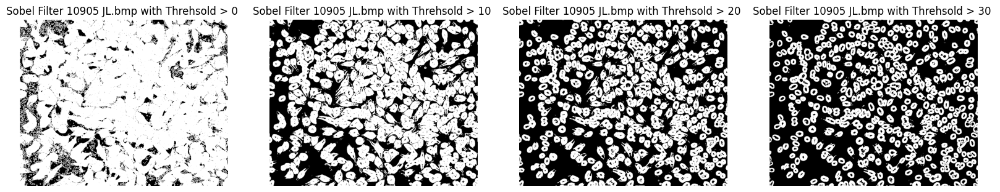

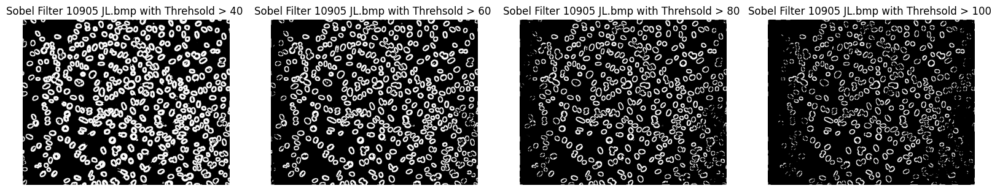

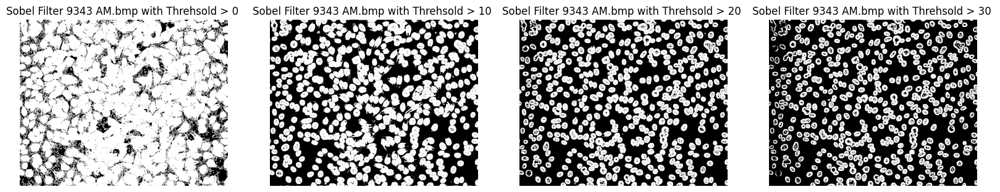

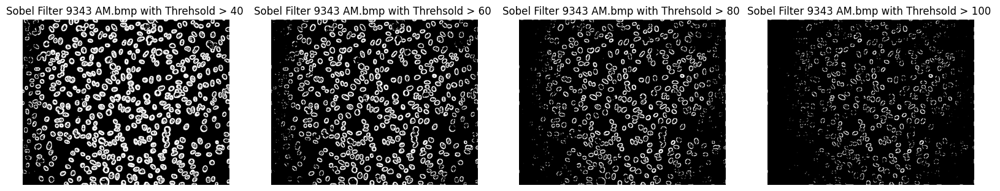

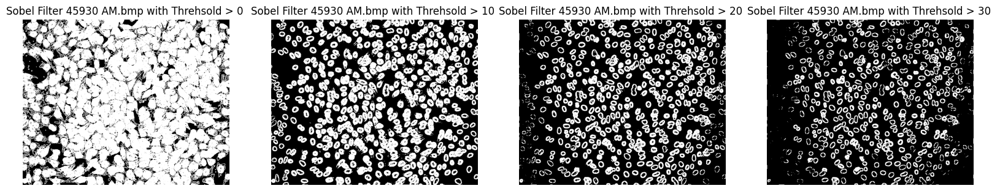

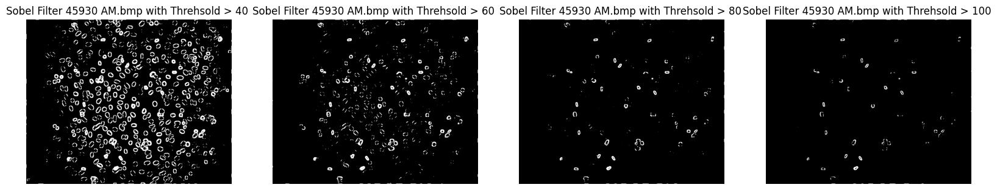

In [7]:

#SobelFiilter
#gaussianblur applied to smooth image an remove background noise
sobel_image1=apply_sobel_filter(apply_gaussian_blur(image1,7,3))
#observe which sobel works best 
plot_binary_image(sobel_image1,thresholds0_30,"Sobel Filter 10905 JL.bmp",(20,20))
plot_binary_image(sobel_image1,thresholds40_100,"Sobel Filter 10905 JL.bmp",(20,20))
#Result sobel>40 for 10905 bmp is the best result
sobel_image2=apply_sobel_filter(apply_gaussian_blur(image2,7,3))
#observe which sobel works best
plot_binary_image(sobel_image2,thresholds0_30,"Sobel Filter 9343 AM.bmp",(20,20)) 
plot_binary_image(sobel_image2,thresholds40_100,"Sobel Filter 9343 AM.bmp",(20,20))
#Result sobel>30
sobel_image3= apply_sobel_filter(apply_gaussian_blur(image3,7,3))
plot_binary_image(sobel_image3,thresholds0_30,"Sobel Filter 45930 AM.bmp",(20,20)) 
plot_binary_image(sobel_image3,thresholds40_100,"Sobel Filter 45930 AM.bmp",(20,20))
#Result sobel>20 works best





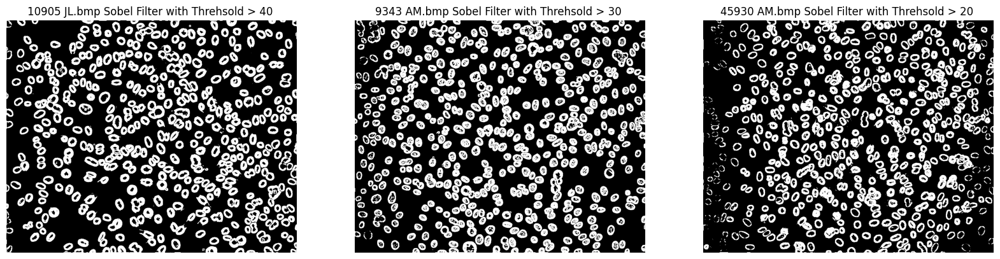

In [8]:
names=["10905 JL.bmp","9343 AM.bmp","45930 AM.bmp"]
filter_name="Sobel Filter"
thresholds=[40,30,20]
images=[sobel_image1,sobel_image2,sobel_image3]

best_result_filter(images,names,filter_name,(20,20),thresholds)

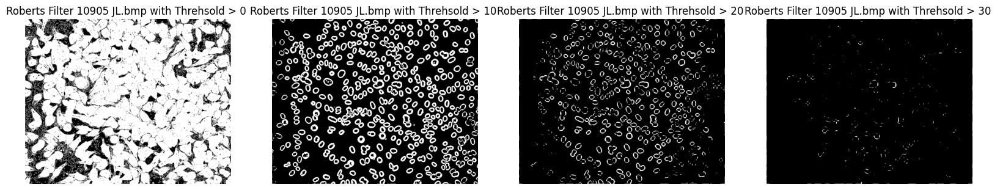

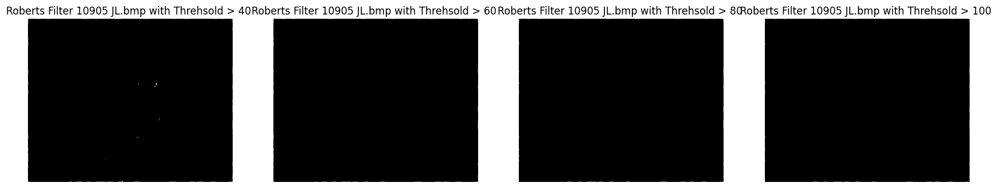

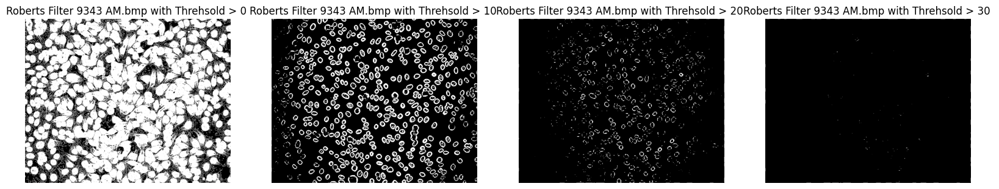

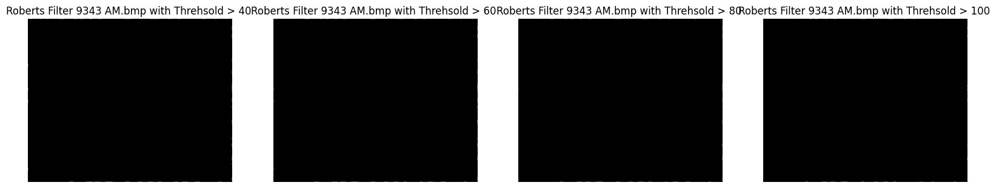

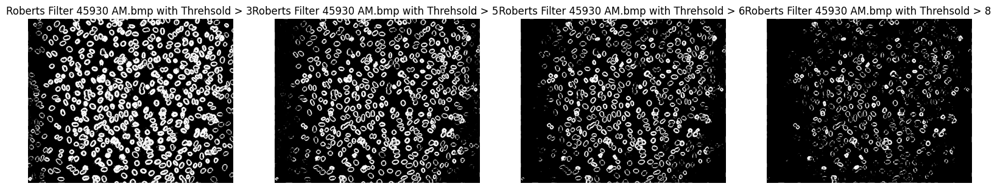

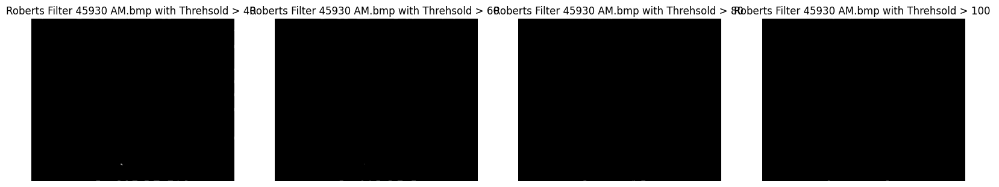

In [9]:
#RobertsFilter
roberts_image1=apply_roberts_filter(apply_gaussian_blur(image1,7,3))
plot_binary_image(roberts_image1,thresholds0_30,f"Roberts Filter {names[0]}",(20,20))
plot_binary_image(roberts_image1,thresholds40_100,f"Roberts Filter {names[0]}",(20,20))
#Best Result >10 for image 1
roberts_image2=apply_roberts_filter(apply_gaussian_blur(image2,7,3))
plot_binary_image(roberts_image2,thresholds0_30,f"Roberts Filter {names[1]}",(20,20))
plot_binary_image(roberts_image2,thresholds40_100,f"Roberts Filter {names[1]}",(20,20))
#Best Result>10 for image2

roberts_image3=apply_roberts_filter(apply_gaussian_blur(image3,7,3))
plot_binary_image(roberts_image3,[3,5,6,8],f"Roberts Filter {names[2]}",(20,20))
plot_binary_image(roberts_image3,thresholds40_100,f"Roberts Filter {names[2]}",(20,20))
#Best Result>3 for image3



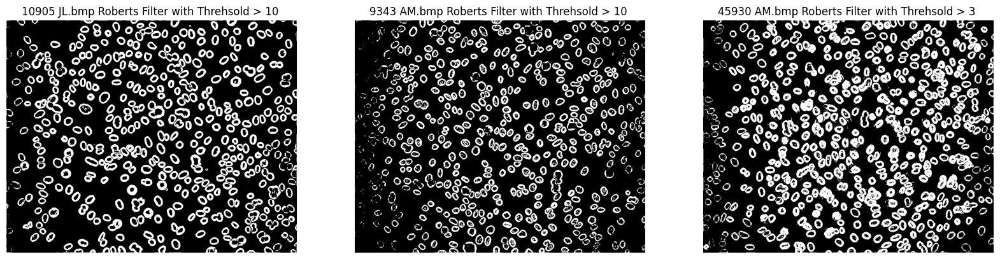

In [10]:
names=["10905 JL.bmp","9343 AM.bmp","45930 AM.bmp"]
filter_name="Roberts Filter"
thresholds=[10,10,3]
images=[roberts_image1,roberts_image2,roberts_image3]

best_result_filter(images,names,filter_name,(20,20),thresholds)

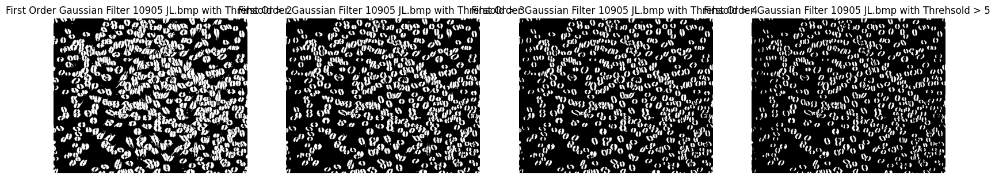

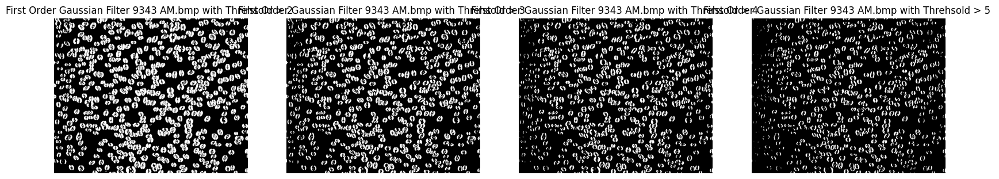

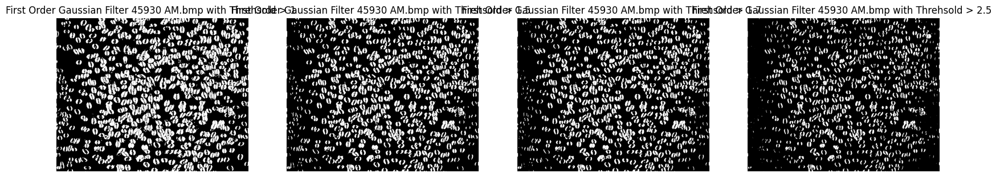

In [11]:
#First Order Gaussian Filter
first_order_gaussian_filter_image1=apply_first_order_gaussian_filter(apply_gaussian_blur(image1,7,3))
plot_binary_image(first_order_gaussian_filter_image1,[2,3,4,5],f"First Order Gaussian Filter {names[0]}",(20,20))
#best result 4 for image 1
first_order_gaussian_filter_image2=apply_first_order_gaussian_filter(apply_gaussian_blur(image2,7,3))
plot_binary_image(first_order_gaussian_filter_image2,[2,3,4,5],f"First Order Gaussian Filter {names[1]}",(20,20))
#best result 3 for image 2

first_order_gaussian_filter_image3=apply_first_order_gaussian_filter(apply_gaussian_blur(image3,7,3))
plot_binary_image(first_order_gaussian_filter_image3,[1,1.5,1.70,2.5],f"First Order Gaussian Filter {names[2]}",(20,20))
#best 1.5



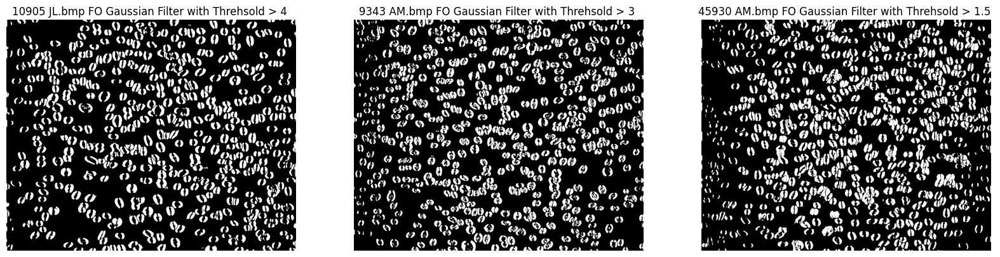

In [12]:
filter_name="FO Gaussian Filter"
thresholds=[4,3,1.5]
images=[first_order_gaussian_filter_image1,first_order_gaussian_filter_image2,first_order_gaussian_filter_image3]
best_result_filter(images,names,filter_name,(20,20),thresholds)

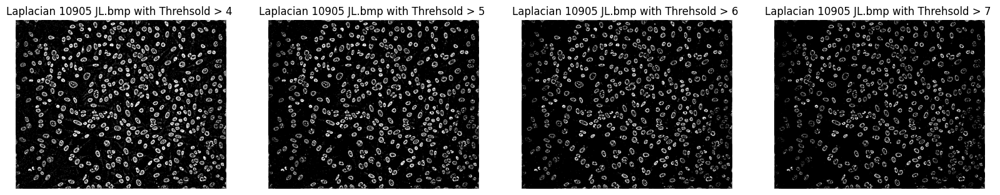

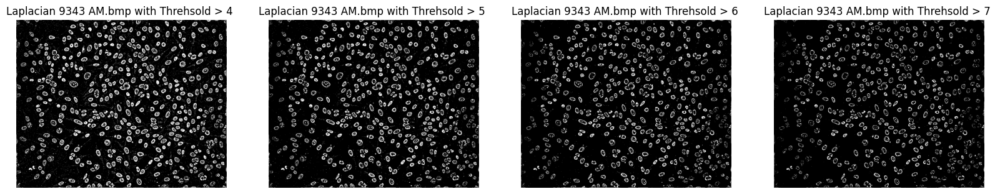

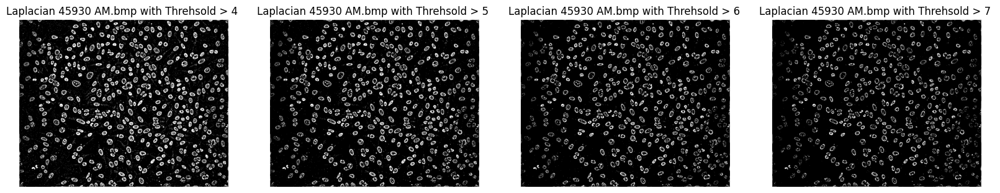

In [13]:
laplacian_image_1=apply_laplacian(apply_gaussian_blur(image1,7,3),1)

plot_binary_image(laplacian_image_1,[4,5,6,7],f"Laplacian {names[0]}",(20,20))
#Best Result >5 for image 1

laplacian_image_2=apply_laplacian(apply_gaussian_blur(image2,7,3),1)

plot_binary_image(laplacian_image_1,[4,5,6,7],f"Laplacian {names[1]}",(20,20))
#Best result>6

laplacian_image_3=apply_laplacian(apply_gaussian_blur(image3,7,3),1)

plot_binary_image(laplacian_image_1,[4,5,6,7],f"Laplacian {names[2]}",(20,20))
#Best Result>5



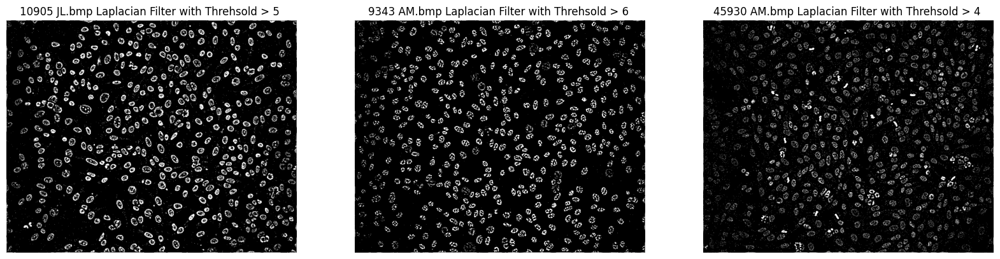

In [14]:
filter_name="Laplacian Filter"
thresholds=[5,6,4]
images=[laplacian_image_1,laplacian_image_2,laplacian_image_3]
best_result_filter(images,names,filter_name,(20,20),thresholds)

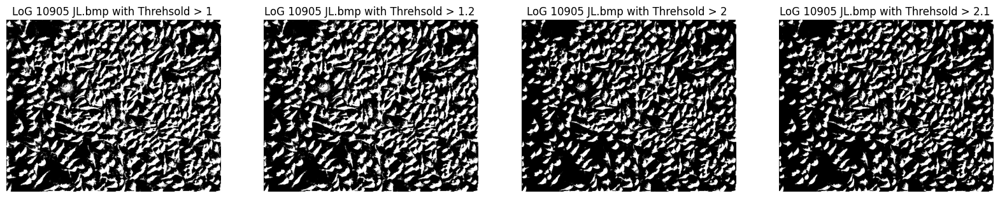

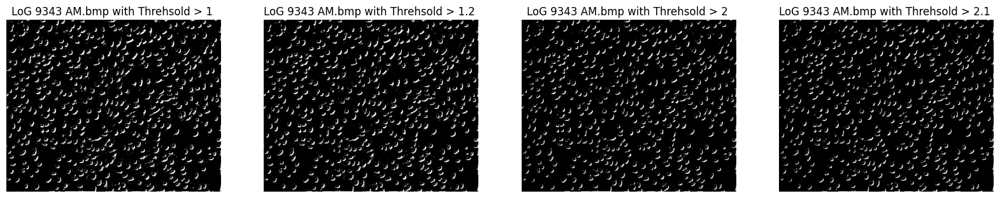

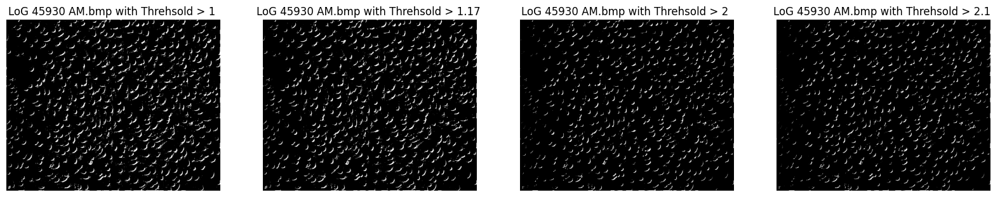

In [15]:
log_image_1=apply_log_filter(image1,1,9)

plot_binary_image(log_image_1,[1,1.2,2,2.1],f"LoG {names[0]}",(20,20))
#Best Result >1.5 for image 1

log_image_2=apply_log_filter(image2,1,5)

plot_binary_image(log_image_2,[1,1.2,2,2.1],f"LoG {names[1]}",(20,20))
#Best result>1.2

log_image_3=apply_log_filter(image3,1,5)

plot_binary_image(log_image_3,[1,1.17,2,2.1],f"LoG {names[2]}",(20,20))
#Best Result>1.17





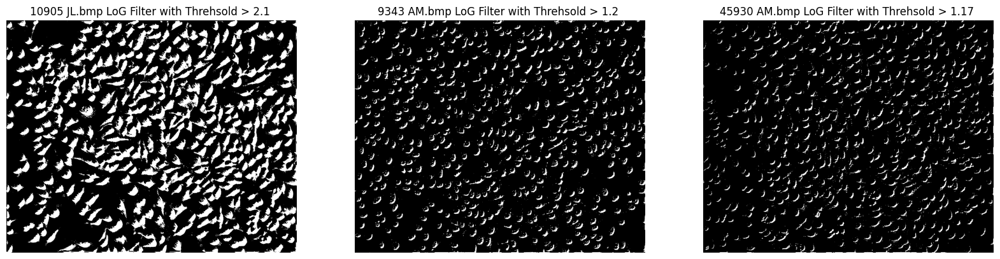

In [16]:
filter_name="LoG Filter"
thresholds=[2.1,1.2,1.17]
images=[log_image_1,log_image_2,log_image_3]
best_result_filter(images,names,filter_name,(20,20),thresholds)

No 3

In [17]:

def apply_prewit_filter(image):
    prewit_x = np.array([
        [-1, 0, 1],
        [-1, 0, 1],
        [-1, 0, 1]
    ])
    prewit_y = np.array([
        [1, 1, 1],
        [0, 0, 0],
        [-1, -1, -1]
    ])
    # Apply the filter
    image_prewit=absolute(convolve2d(image,prewit_x,mode='same'),convolve2d(image,prewit_y,mode='same'))
    return image_prewit
def apply_canny(image,lower_threshold,upper_threhold):
    image_canny=cv2.Canny(image,lower_threshold,upper_threhold)
    return image_canny
def apply_frei_chen(image):
    #define the 9 matrix that makes frei_chen
    G1 = (1/(2*np.sqrt(2))) * np.array([[1, np.sqrt(2), 1],
                                [0, 0, 0],
                                [-1, -np.sqrt(2), -1]])
    G2 = (1/(2*np.sqrt(2))) * np.array([[1, 0, -1],
                                [np.sqrt(2), 0, -np.sqrt(2)],
                                [1, 0, -1]])
    G3 = (1/(2*np.sqrt(2))) * np.array([[0, -1, np.sqrt(2)],
                                [1, 0, -1],
                                [-np.sqrt(2), 1, 0]])
    G4 = (1/(2*np.sqrt(2))) * np.array([[np.sqrt(2), -1, 0],
                                [-1, 0, 1],
                                [0, 1, -np.sqrt(2)]])
    G5 = (1/2) * np.array([[0, 1, 0],
                       [-1, 0, -1],
                       [0, 1, 0]])
    G6 = (1/2) * np.array([[-1, 0, 1],
                       [0, 0, 0],
                       [1, 0, -1]])
    G7 = (1/6) * np.array([[1, -2, 1],
                       [-2, 4, -2],
                       [1, -2, 1]])
    G8 = (1/6) * np.array([[-2, 1, -2],
                       [1, 4, 1],
                       [-2, 1, -2]])
    G9 = (1/3) * np.array([[1, 1, 1],
                       [1, 1, 1],
                       [1, 1, 1]])
    G_matrices=[G1,G2,G3,G4,G5,G6,G7,G8,G9]
    convolved_images=[]
    #convolve image with the matrix and store them in covolved images list
    for _,matrix in enumerate(G_matrices):
        convolve=convolve2d(image,matrix)
        convolved_images.append(convolve)
    #absolute all values
    absolute_values=[]
    for values in convolved_images:
        absolute=np.abs(values)
        absolute_values.append(absolute)
    #sum all absolute values
    image_frei_chen=absolute_values[0]
    for i in range(1,len(absolute_values)):
        image_frei_chen=np.add(image_frei_chen,absolute_values[i])
    return image_frei_chen

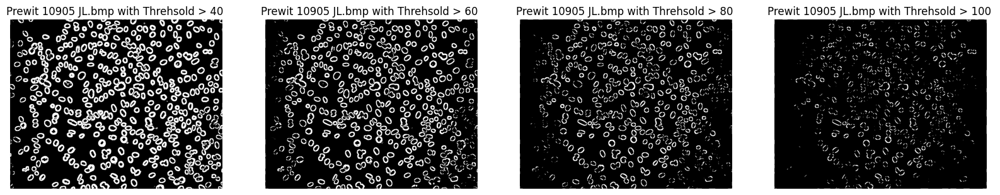

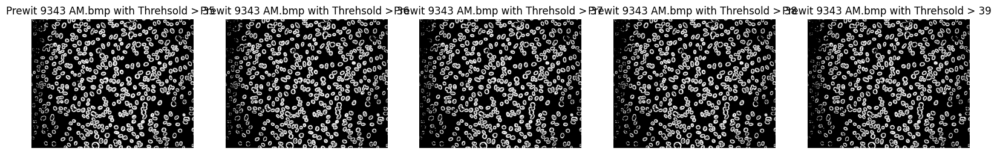

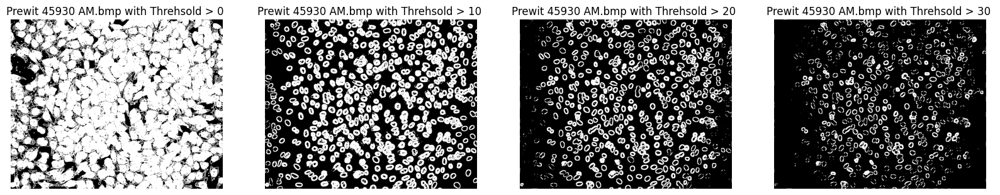

In [18]:
prewit_image1=apply_prewit_filter(apply_gaussian_blur(image1,7,3))
plot_binary_image(prewit_image1,thresholds40_100,f"Prewit {names[0]}",(20,20))
#Best Result >40 for image 1
prewit_image2=apply_prewit_filter(apply_gaussian_blur(image2,7,3))
plot_binary_image(prewit_image2,[35,36,37,38,39],f"Prewit {names[1]}",(20,20))
#Best result,35
prewit_image3=apply_prewit_filter(apply_gaussian_blur(image3,7,3))
plot_binary_image(prewit_image3,thresholds0_30,f"Prewit {names[2]}",(20,20))
#Best result>10

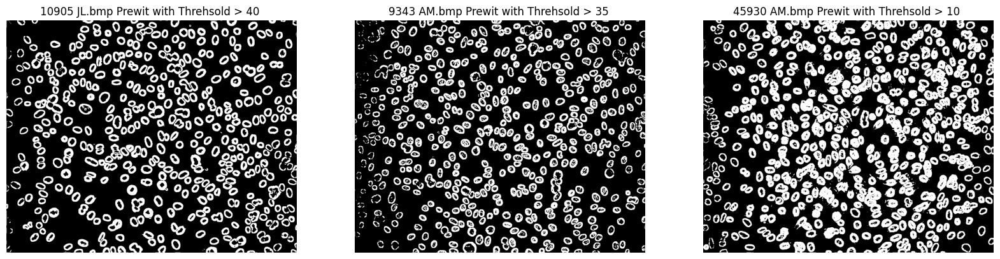

In [19]:
filter_name="Prewit"
thresholds=[40,35,10]
images=[prewit_image1,prewit_image2,prewit_image3]
best_result_filter(images,names,filter_name,(20,20),thresholds)

(-0.5, 1279.5, 1023.5, -0.5)

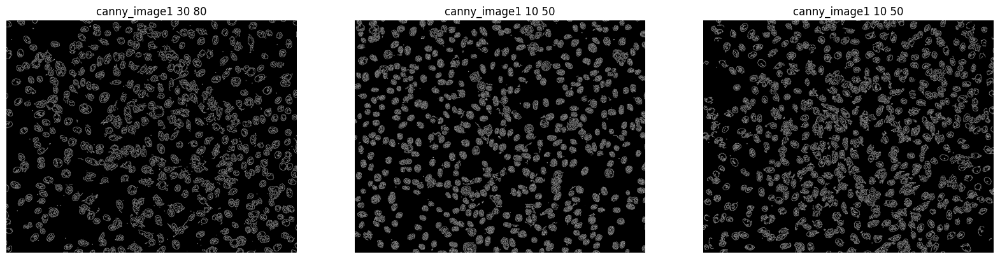

In [20]:
canny_image1=apply_canny(image1,30,80) # gaussian blur not needed due to  canny already applying one 
# no need of thresholding
fig, plot = plt.subplots(1, 3, figsize=(20,20 ))
plot[0].imshow(canny_image1, cmap='gray')
plot[0].set_title('canny_image1 30 80')
plot[0].axis('off')
#Best Result >40 for image 1
canny_image2=apply_canny(image2,10,50)
plot[1].imshow(canny_image2, cmap='gray')
plot[1].set_title('canny_image1 10 50')
plot[1].axis('off')
#Best result,35
canny_image3=apply_canny(image3,10,50)
plot[2].imshow(canny_image3, cmap='gray')
plot[2].set_title('canny_image1 10 50')
plot[2].axis('off')
#Best result>10
#increasing the lower and upper threshold distance seems to do a great job of differentiatiin, 
# too low of lower threshold results in in the dots not being seperated perfectly  as there are effects of hysteria that seems like noise

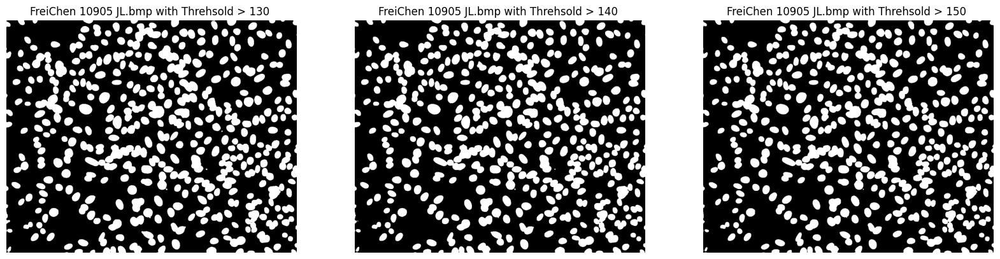

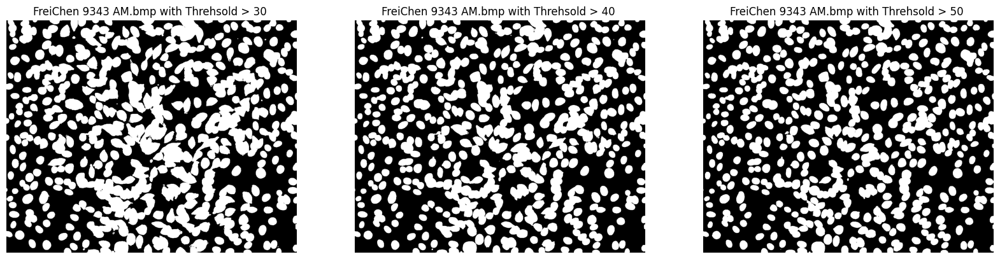

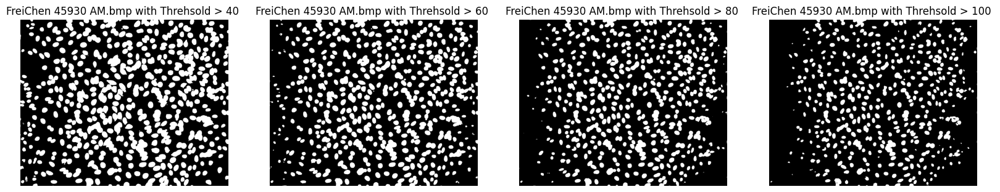

In [21]:
frei_chen_image1=apply_frei_chen(apply_gaussian_blur(image1,7,3))

plot_binary_image(frei_chen_image1,[130,140,150],f"FreiChen {names[0]}",(20,20))
#Best Result >130 seems to do very well with but it highlights all the pixels inside the edges white
frei_chen_image2=apply_frei_chen(apply_gaussian_blur(image2,7,3))

plot_binary_image(frei_chen_image2,[30,40,50],f"FreiChen {names[1]}",(20,20))
#Best result >50 seems to do very well with but it highlights all the pixels inside the edges whit

frei_chen_image3=apply_frei_chen(apply_gaussian_blur(image3,7,3))

plot_binary_image(frei_chen_image3,thresholds40_100,f"FreiChen {names[2]}",(20,20))
#Best result>40 seems to do very well with but it highlights all the pixels inside the edges whit

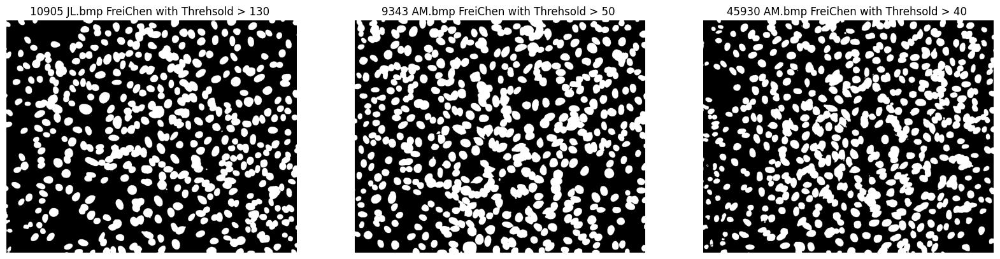

In [22]:
filter_name="FreiChen"
thresholds=[130,50,40]
images=[frei_chen_image1,frei_chen_image2,frei_chen_image3]
best_result_filter(images,names,filter_name,(20,20),thresholds)

No4

In [24]:
from sklearn.metrics import roc_curve, auc
#Calculater ROC on 1 image 
#compare 3 algorithms sobel, Laplacian, and linearofGaussian
# use image 1 which is 10905 JL,bmp
g_truth_image1=cv2.imread('cells/10905 JL Edges.bmp')[:,:,1] #select only the green channel 
frei_chen_threshold=130
prewit_threshold=40
log_threshold=2.1
roberts_image_threshold=10
first_order_gaussian_threshold=4
laplacian_threshold=5
sobel_threshold=40
#Canny uses lower and upperBound threshold  (best is 30,80)




# _, plot = plt.subplots(1, 5, figsize=(20, 20))
# plot[0].imshow(image1, cmap='gray')
# plot[0].set_title('Original Image')
# plot[0].axis('off')

# plot[1].imshow(g_truth_image1, cmap='gray')
# plot[1].set_title('Ground Truth')
# plot[1].axis('off')

# plot[2].imshow(sobel_image> sobel_threshold, cmap='gray')
# plot[2].set_title('Sobel ')
# plot[2].axis('off')

# plot[3].imshow(frei_chen_image > frei_chen_threshold, cmap='gray')
# plot[3].set_title('FreiChen')
# plot[3].axis('off')

# plot[4].imshow(prewit_image > prewit_threshold, cmap='gray')
# plot[4].set_title('Prewitt')
# plot[4].axis('off')



plt.show()



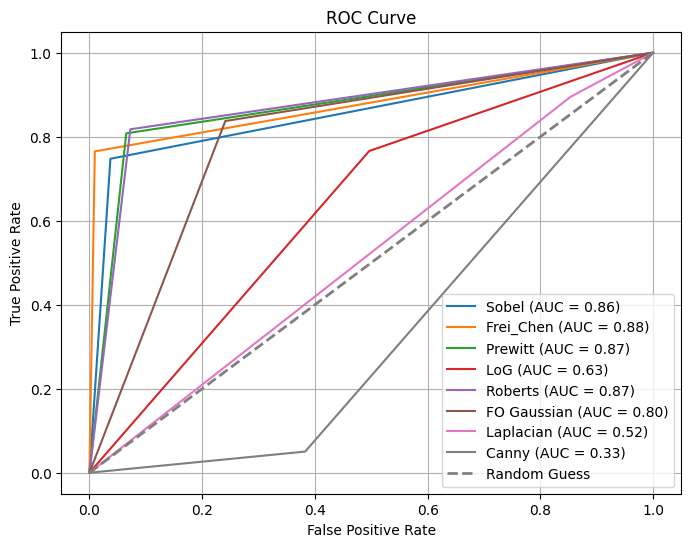

In [31]:

# Calculate ROC curve and AUC

# print(g_truth_image1.shape[:2])
# print(sobel_image.shape)

#needs to be resized to match ground truth size

resized_sobel=cv2.resize(sobel_image1.astype(float), (g_truth_image1.shape[1],g_truth_image1.shape[0]), interpolation=cv2.INTER_AREA)
resized_frei_chen=cv2.resize(frei_chen_image1.astype(float), (g_truth_image1.shape[1],g_truth_image1.shape[0]), interpolation=cv2.INTER_AREA)
resized_prewitt=cv2.resize(prewit_image1.astype(float), (g_truth_image1.shape[1],g_truth_image1.shape[0]), interpolation=cv2.INTER_AREA)
resized_log=cv2.resize(log_image_1.astype(float), (g_truth_image1.shape[1],g_truth_image1.shape[0]), interpolation=cv2.INTER_AREA)
resized_roberts=cv2.resize(roberts_image1.astype(float), (g_truth_image1.shape[1],g_truth_image1.shape[0]), interpolation=cv2.INTER_AREA)
resized_fo_gaussian=cv2.resize(first_order_gaussian_filter_image1.astype(float), (g_truth_image1.shape[1],g_truth_image1.shape[0]), interpolation=cv2.INTER_AREA)
resized_laplacian=cv2.resize(laplacian_image_1.astype(float), (g_truth_image1.shape[1],g_truth_image1.shape[0]), interpolation=cv2.INTER_AREA)
resized_canny=cv2.resize(canny_image1.astype(float), (g_truth_image1.shape[1],g_truth_image1.shape[0]), interpolation=cv2.INTER_AREA)
fpr_sobel, tpr_sobel, _ = roc_curve((g_truth_image1>0).flatten(), ~((resized_sobel>sobel_threshold).flatten()))
fpr_frei_chen, tpr_frei_chen, _ = roc_curve((g_truth_image1>0).flatten(), ~((resized_frei_chen>frei_chen_threshold).flatten()))
fpr_prewitt, tpr_prewitt, _ = roc_curve((g_truth_image1>0).flatten(), ~((resized_prewitt>prewit_threshold).flatten()))
fpr_log, tpr_log, _ = roc_curve((g_truth_image1>0).flatten(), ~((resized_log>log_threshold).flatten()))
fpr_roberts, tpr_roberts, _ = roc_curve((g_truth_image1>0).flatten(), ~((resized_roberts>roberts_image_threshold).flatten()))
fpr_fo_gaussian, tpr_fo_gaussian, _ = roc_curve((g_truth_image1>0).flatten(), ~((resized_fo_gaussian>first_order_gaussian_threshold).flatten()))
fpr_laplacian, tpr_laplacian, _ = roc_curve((g_truth_image1>0).flatten(), ~((resized_laplacian>laplacian_threshold).flatten()))
fpr_canny, tpr_canny, _ = roc_curve((g_truth_image1>0).flatten(),canny_image1.flatten())
auc_sobel = auc(fpr_sobel, tpr_sobel)
auc_frei_chen = auc(fpr_frei_chen, tpr_frei_chen)
auc_prewit = auc(fpr_prewitt, tpr_prewitt)
auc_log = auc(fpr_log, tpr_log)
auc_roberts = auc(fpr_roberts, tpr_roberts)
auc_fo_gaussian = auc(fpr_fo_gaussian, tpr_fo_gaussian)
auc_laplacian = auc(fpr_laplacian, tpr_laplacian)
auc_canny= auc(fpr_canny, tpr_canny)
# Plot ROC curves
plt.figure(figsize=(8, 6))
plt.plot(fpr_sobel, tpr_sobel, label=f'Sobel (AUC = {auc_sobel:.2f})')
plt.plot(fpr_frei_chen, tpr_frei_chen, label=f'Frei_Chen (AUC = {auc_frei_chen:.2f})')
plt.plot(fpr_prewitt, tpr_prewitt, label=f'Prewitt (AUC = {auc_prewit:.2f})')
plt.plot(fpr_log, tpr_log, label=f'LoG (AUC = {auc_log:.2f})')
plt.plot(fpr_roberts, tpr_roberts, label=f'Roberts (AUC = {auc_roberts:.2f})')
plt.plot(fpr_fo_gaussian, tpr_fo_gaussian, label=f'FO Gaussian (AUC = {auc_fo_gaussian:.2f})')
plt.plot(fpr_laplacian, tpr_laplacian, label=f'Laplacian (AUC = {auc_laplacian:.2f})')
plt.plot(fpr_canny, tpr_canny, label=f'Canny (AUC = {auc_canny:.2f})')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.grid(True)
plt.show()


In [367]:


sensitivity_sobel = tpr_sobel
specificity_sobel = 1 - fpr_sobel
sensitivity_frei_chen = tpr_frei_chen
specificity_frei_chen = 1 - tpr_frei_chen
sensitivity_prewitt = tpr_prewitt
specificity_prewitt = 1 - tpr_prewitt


print(sensitivity_frei_chen.shape)
print("Sensitivity and Specificity for Sobel:")
print("Sensitivity:", sensitivity_sobel)
print("Specificity:", specificity_sobel)

print("Sensitivity and Specificity for Frei_Chen:")
print("Sensitivity:", sensitivity_frei_chen)
print("Specificity:", specificity_frei_chen)

print("Sensitivity and Specificity for Prewitt:")
print("Sensitivity:", sensitivity_prewitt)
print("Specificity:", specificity_prewitt)

(3,)
Sensitivity and Specificity for Sobel:
Sensitivity: [0.         0.72785067 1.        ]
Specificity: [1.         0.91173505 0.        ]
Sensitivity and Specificity for Frei_Chen:
Sensitivity: [0.         0.74658158 1.        ]
Specificity: [1.         0.25341842 0.        ]
Sensitivity and Specificity for Prewitt:
Sensitivity: [0.         0.82803484 1.        ]
Specificity: [1.         0.17196516 0.        ]
